In [1]:
import json
import torch
import matplotlib.pyplot as plt
from transformers.models.qwen2 import Qwen2ForCausalLM, Qwen2Tokenizer
from tmp import get_data, calc_eqk, calc_rope, rotate_half, get_e_map, get_attn_map, plot_attn_map

# Collect Data

In [2]:
tokenizer = Qwen2Tokenizer.from_pretrained("Qwen/Qwen2.5-7B")
model = Qwen2ForCausalLM.from_pretrained(
    "Qwen/Qwen2.5-7B",
    torch_dtype=torch.bfloat16,
    attn_implementation='flash_attention_2',
).to('cuda')

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

In [3]:
DATA_DIR = '/home/chengzhang/blob/evaluation/ruler/benchmark_root'
BASE_MODEL = 'Qwen2.5-3B'

def load_data(length: int, task: str):
    data_path = f'{DATA_DIR}/{BASE_MODEL}/synthetic/{length}/data/{task}/validation.jsonl'
    with open(data_path) as f:
        data = [json.loads(line) for line in f.readlines()]
    return data

# data = load_data(131072, "niah_multikey_3")
data = load_data(131072, "fwe")
# data = load_data(131072, "vt")

In [4]:
def call_model(inputs: str):
    inputs = tokenizer(inputs, return_tensors="pt")
    with torch.no_grad():
        outputs = model(input_ids=inputs['input_ids'].to('cuda'), use_cache=False)
    return outputs

outputs = call_model(data[8]['input'])

Saving data for layer 0
Saving data for layer 1
Saving data for layer 2
Saving data for layer 3
Saving data for layer 4
Saving data for layer 5
Saving data for layer 6
Saving data for layer 7
Saving data for layer 8
Saving data for layer 9
Saving data for layer 10
Saving data for layer 11
Saving data for layer 12
Saving data for layer 13
Saving data for layer 14
Saving data for layer 15
Saving data for layer 16
Saving data for layer 17
Saving data for layer 18
Saving data for layer 19
Saving data for layer 20
Saving data for layer 21
Saving data for layer 22
Saving data for layer 23
Saving data for layer 24
Saving data for layer 25
Saving data for layer 26
Saving data for layer 27


# Analysis

(0.9899473274393945, 0.9589217150831141)

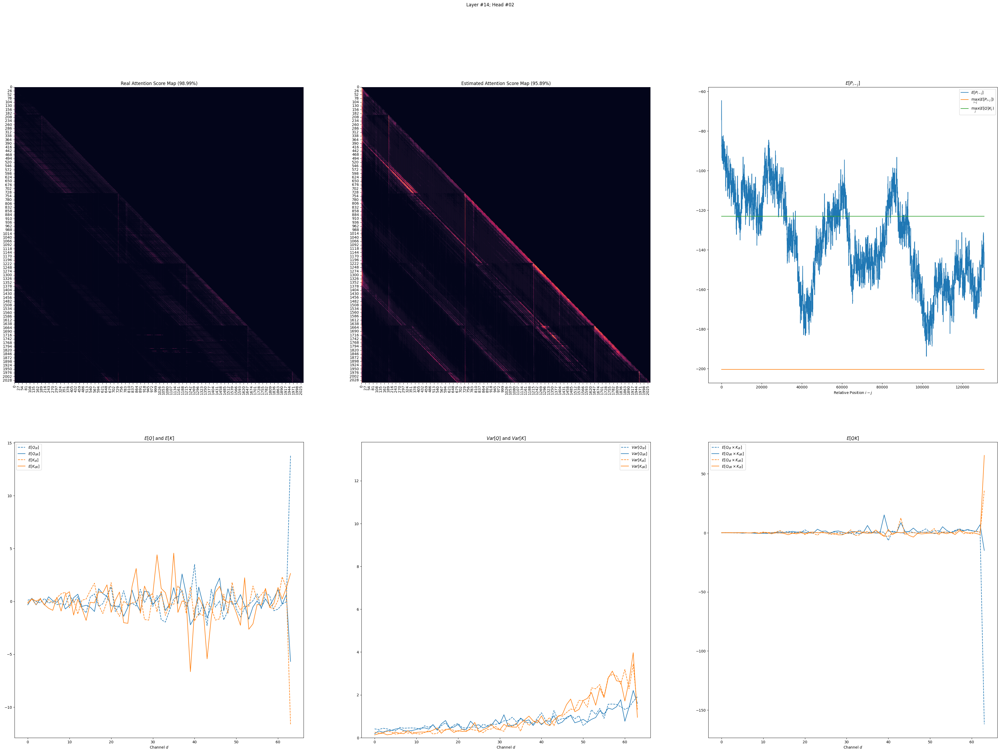

In [2]:
plot_attn_map('Qwen2.5-7B-128k-VT-0', 14, 2, output_dir=None)

(0.9871426794077972, 0.9868703655573008)

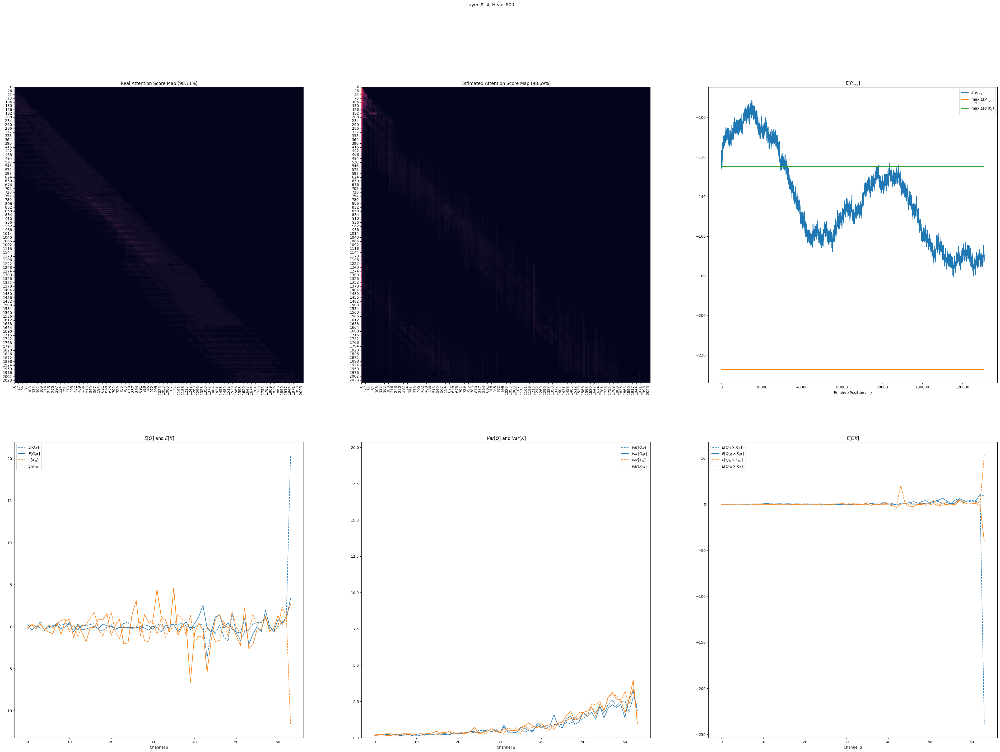

In [3]:
plot_attn_map('Qwen2.5-7B-128k-VT-0', 14, 0, output_dir=None)

(0.9874233325989069, 0.957092672285623)

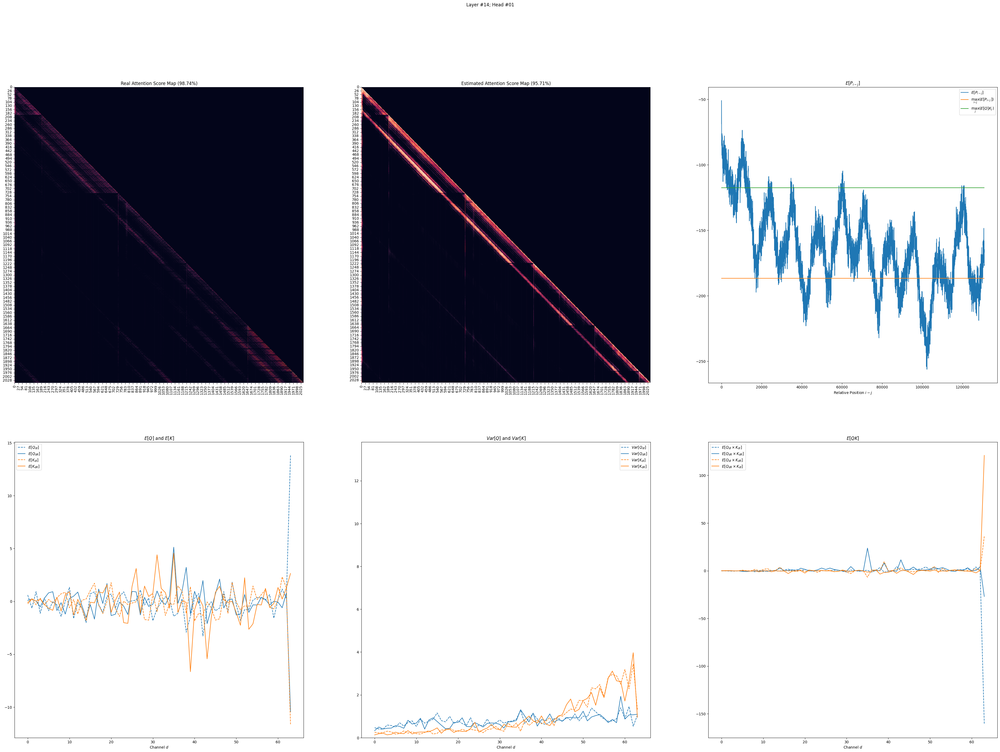

In [4]:
plot_attn_map('Qwen2.5-7B-128k-VT-0', 14, 1, output_dir=None)

(0.973971274239086, 0.9589217150831141)

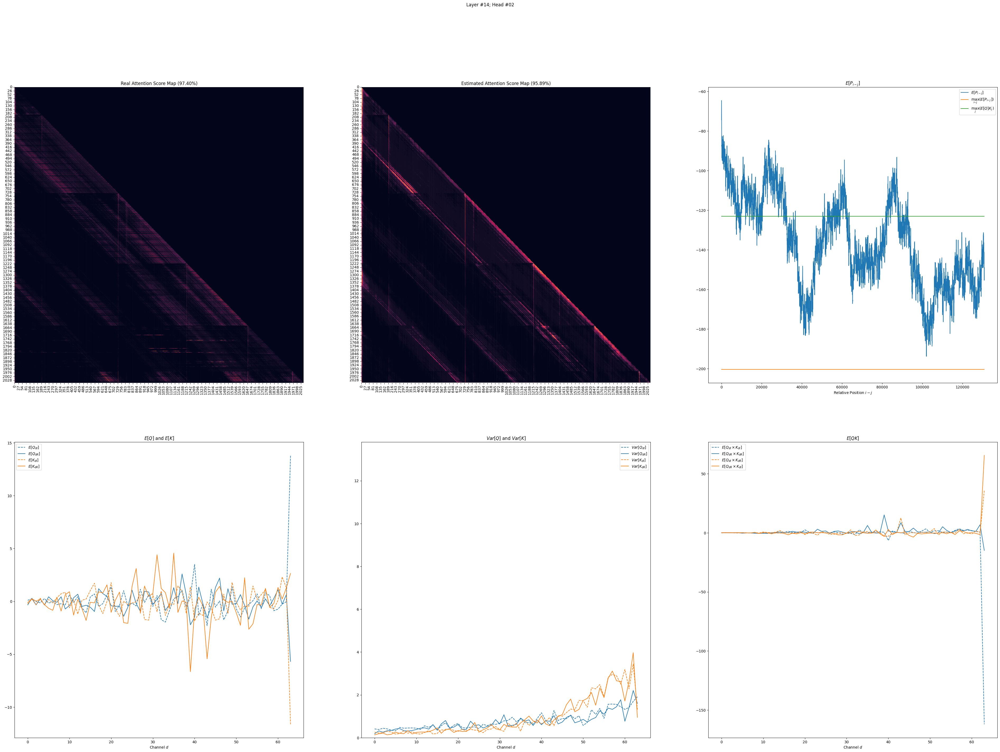

In [5]:
plot_attn_map('Qwen2.5-7B-128k-VT-0', 14, 2, output_dir=None)

(0.6934873183044479, 0.013523103291988692)

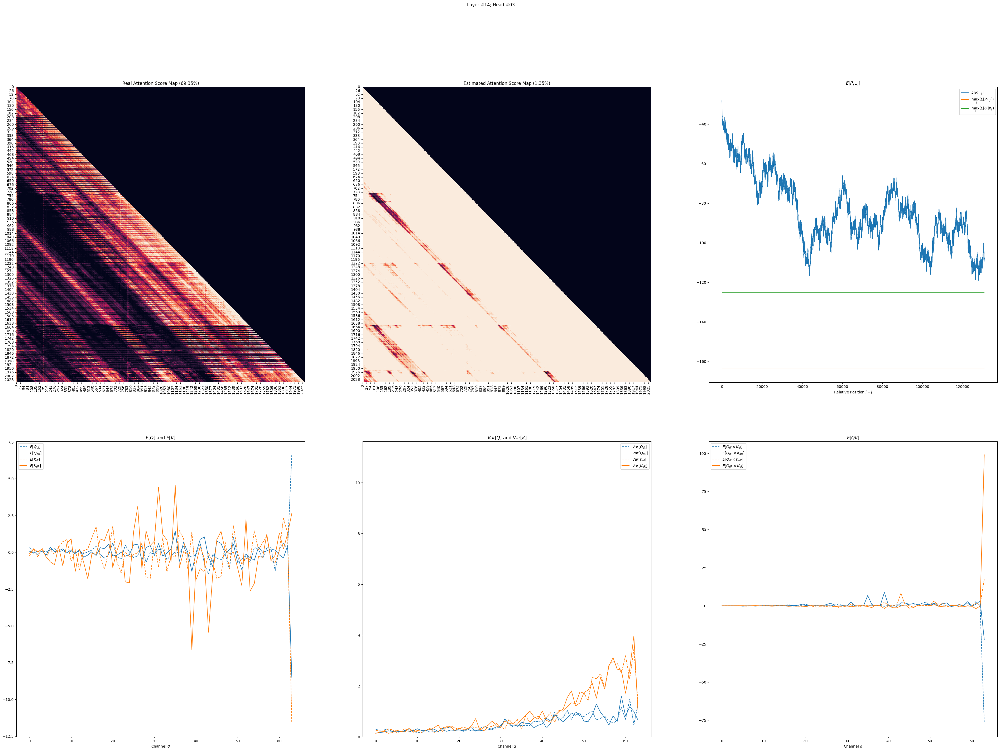

In [ ]:
plot_attn_map('Qwen2.5-7B-128k-VT-0', 14, 3, output_dir=None)

(0.9842620108578367, 0.9876413666285853)

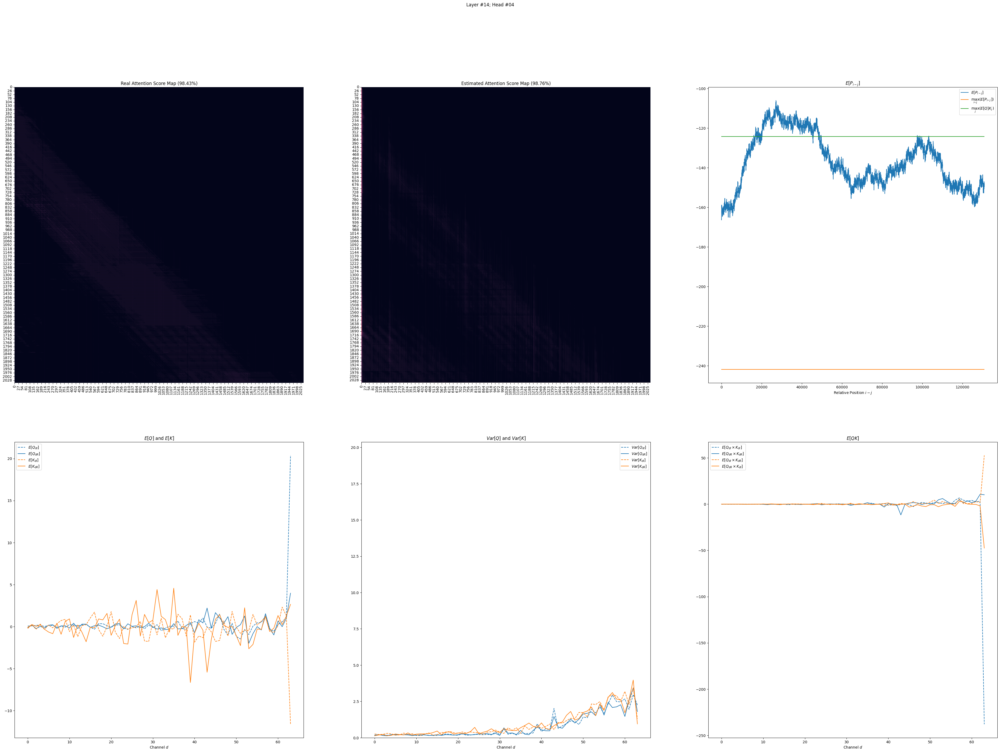

In [7]:
plot_attn_map('Qwen2.5-7B-128k-VT-0', 14, 4, output_dir=None)

(0.999193452875829, 0.9975015197605585)

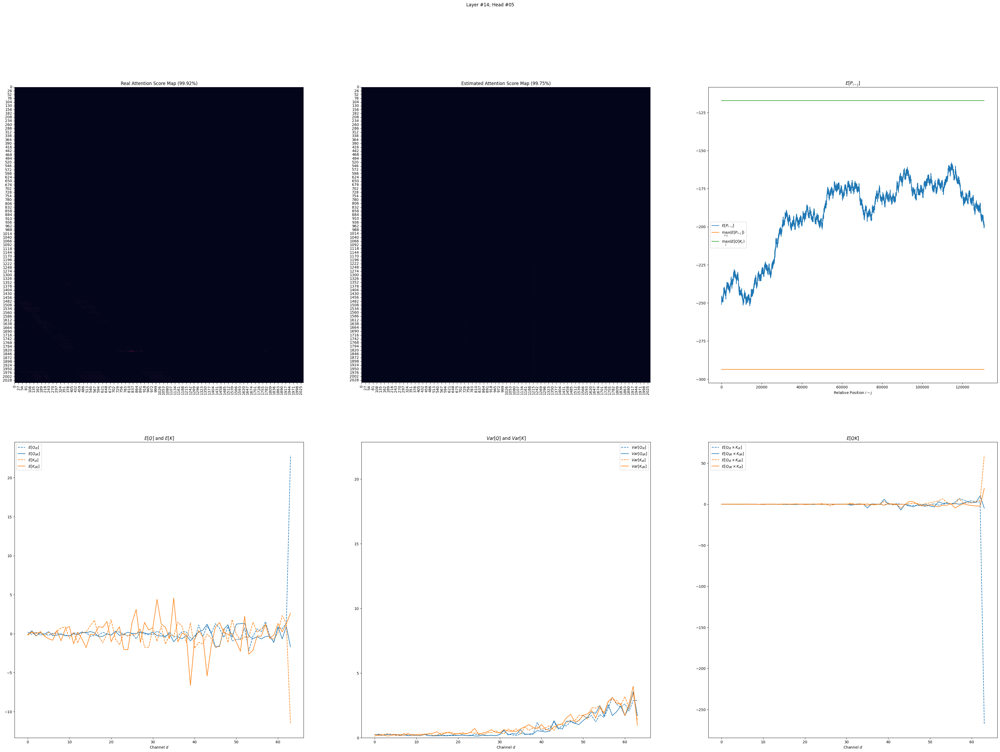

In [8]:
plot_attn_map('Qwen2.5-7B-128k-VT-0', 14, 5, output_dir=None)

(0.9905852299698241, 0.9520127557112633)

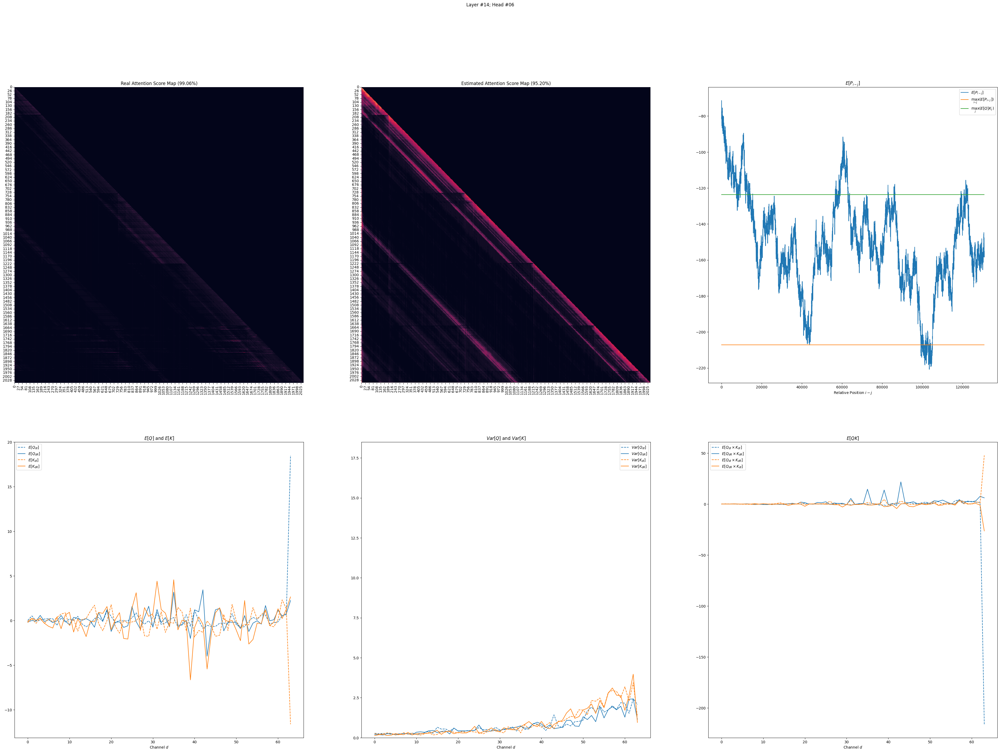

In [9]:
plot_attn_map('Qwen2.5-7B-128k-VT-0', 14, 6, output_dir=None)

(0.9956359069106419, 0.9958681421403391)

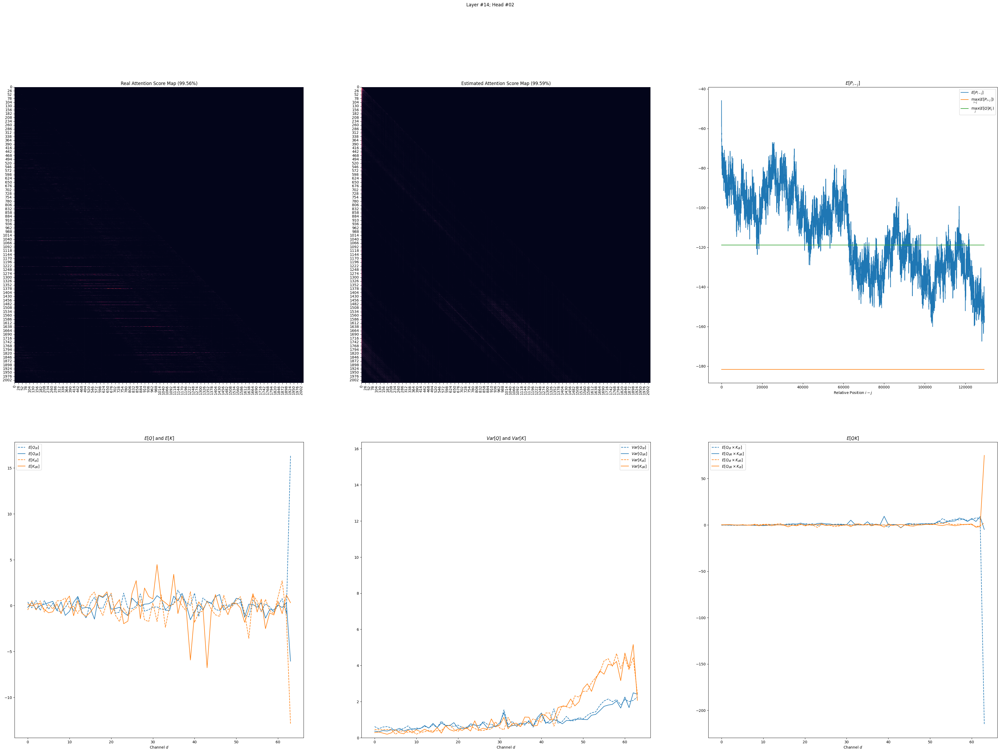

In [2]:
plot_attn_map('Qwen2.5-7B-128k-MultiKey3-0', 14, 2, output_dir=None)

(0.9928914767282907, 0.52104398501256)

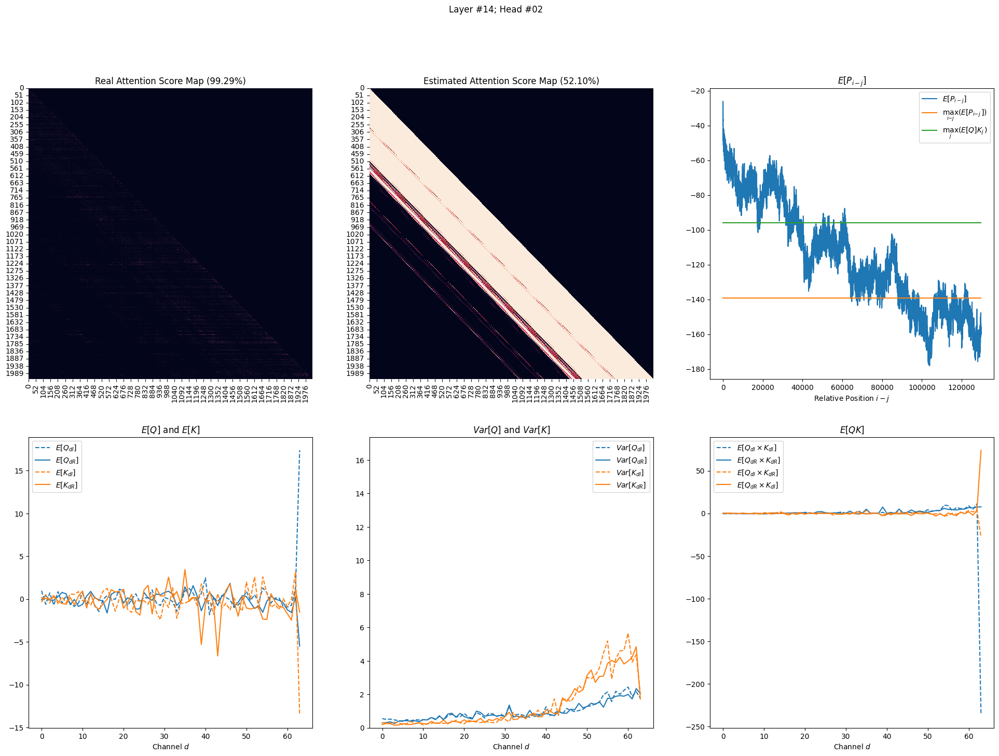

In [5]:
plot_attn_map('Qwen2.5-7B-128k-FWE-0', 14, 2, output_dir=None)

In [ ]:
plot_attn_map(18, 20, save=False)

In [ ]:
plot_attn_map(12, 12, save=False)

In [ ]:
plot_attn_map(0, 18, save=False)

In [ ]:
plot_attn_map(0, 20, save=False)

# Temp

In [25]:
layer_idx = 0
head_idx = 2
q, k, v, o, q_rope, k_rope = get_data(layer_idx=layer_idx)
batch_size, num_q_heads, num_tokens, head_size = q.shape
num_k_heads = k.shape[1]
group_size = num_q_heads // num_k_heads
head_idx_k = head_idx // group_size
p = 9.0 * (head_size ** 0.5)

$$p = \max\left(\max_{i-j}\left(\sum_d E[Q_dR_{i-j}K_d] \right), \max_j\left(\sum_d K_{jd}E[Q_d] \right)\right) - 12.0$$

tensor(1185.3759, device='cuda:0')
tensor(1154.7283, device='cuda:0')
tensor(1261.0649, device='cuda:0')
tensor(1183.6449, device='cuda:0')


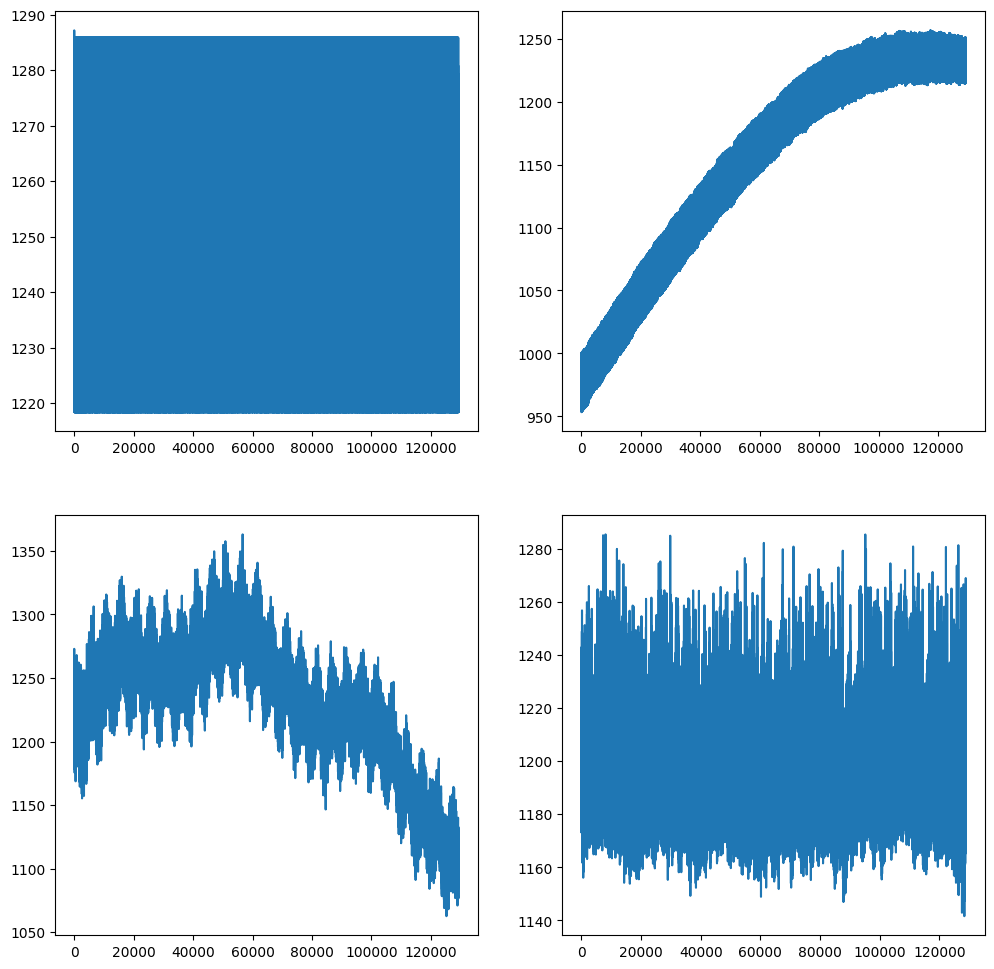

In [26]:
eqk1 = torch.sum(torch.mean(q[0, head_idx], dim=0, keepdim=True) * k[0, head_idx_k], dim=-1, dtype=torch.float32)
print(torch.max(eqk1) - p)
eqk2 = torch.sum(torch.mean(q_rope[0, head_idx], dim=0, keepdim=True) * k_rope[0, head_idx_k], dim=-1, dtype=torch.float32)
print(torch.max(eqk2) - p)
eqk3 = torch.sum(torch.mean(q[0, head_idx], dim=0, keepdim=True) * k_rope[0, head_idx_k], dim=-1, dtype=torch.float32)
print(torch.max(eqk3) - p)

eq = torch.mean(q[0, head_idx], dim=0, keepdim=True)
position_ids = torch.randint(0, num_tokens, (256, ), dtype=torch.float32, device=q.device)
cos, sin = calc_rope(position_ids, head_dim=head_size)
eq_embed = (eq * torch.cat([cos, cos], dim=-1)) + (rotate_half(eq) * torch.cat([sin, sin], dim=-1))
# eqk4 = torch.sum(torch.mean(q[0, head_idx], dim=0, keepdim=True) * k_rope[0, head_idx_k], dim=-1, dtype=torch.float32)
ep = torch.einsum('mk, nk -> mn', eq_embed, k_rope[0, head_idx_k].to(torch.float32))
ep = torch.where(position_ids[:, None] >= torch.arange(0, num_tokens, dtype=torch.float32, device=q.device)[None, :], ep, float('-inf'))
eqk4 = ep.max(dim=0).values
print(torch.max(eqk4) - p)
# print(position_ids.to(torch.int32))

_, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 12))
ax1.plot(eqk1.cpu().numpy())
ax2.plot(eqk2.cpu().numpy())
ax3.plot(eqk3.cpu().numpy())
ax4.plot(eqk4.cpu().numpy())

1154.7282592513247
1226.1766235091372
1586.1766235091372
-363.82337649086287 1181.8775512435122 2330.1766235091372


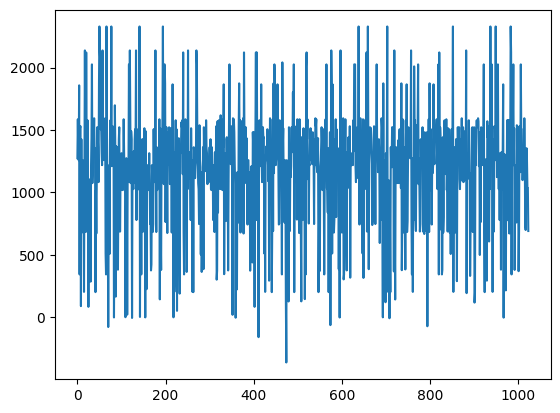

In [29]:
num_samples = 1024
# sample_stride = (num_tokens + num_samples - 1) // num_samples
# qk = torch.einsum('mk, nk -> mn', q_rope[0, head_idx, ::sample_stride], k_rope[0, head_idx_k])
# mask = torch.arange(0, num_tokens, sample_stride, device=k.device)[:, None] >= torch.arange(num_tokens, device=k.device)[None, :]
sample_ids = torch.randint(0, num_tokens, (num_samples, ), dtype=torch.int64, device=q.device)
qk = torch.einsum('mk, nk -> mn', q_rope[0, head_idx, sample_ids], k_rope[0, head_idx_k])
mask = sample_ids[:, None] >= torch.arange(num_tokens, device=k.device)[None, :]
qk = torch.where(mask, qk, float('-inf'))
max_qk = qk.max(dim=-1).values.to(torch.float32)
max_eqk = torch.max(torch.sum(torch.mean(q_rope[0, head_idx], dim=0, keepdim=True) * k_rope[0, head_idx_k], dim=-1, dtype=torch.float32)).item()
print(max_eqk - p)
print(max_qk.median().item() - p)
print(max_qk.quantile(0.9).item() - p)
print(max_qk.min().item() - p, max_qk.mean().item() - p, max_qk.max().item() - p)
plt.plot(max_qk.to(torch.float32).cpu().numpy() - p)

In [ ]:
mean, std = k[0, 1].mean(dim=0), k[0, 1].std(dim=0)
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(16, 6))
ax0.plot(mean.to(torch.float32).cpu().numpy())
ax0.plot(std.to(torch.float32).cpu().numpy())
cnt = torch.sum((k[0, 1] < (mean - 5 * std)[None, :]) | (k[0, 1] > (mean + 5 * std)[None, :]), dim=0, dtype=torch.int32)
ax1.plot(cnt.cpu().numpy())

In [ ]:
mean, std = k_rope[0, 1].mean(dim=0), k_rope[0, 1].std(dim=0)
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(16, 6))
ax0.plot(mean.to(torch.float32).cpu().numpy())
ax0.plot(std.to(torch.float32).cpu().numpy())
cnt = torch.sum((k_rope[0, 1] < (mean - 5 * std)[None, :]) | (k_rope[0, 1] > (mean + 5 * std)[None, :]), dim=0, dtype=torch.int32)
ax1.plot(cnt.cpu().numpy())

In [ ]:
# q[0, 12].mean(dim=0), q[0, 12].var(dim=0)
# plt.boxplot()
x = q[0, 12].T.to(torch.float32).cpu().numpy()
plt.boxplot([x[i] for i in range(x.shape[0])])

In [ ]:
x = (q[0, 12] * k[0, 12 // 7]).T.to(torch.float32).cpu().numpy()
plt.boxplot([x[i] for i in range(x.shape[0])])

In [ ]:
q_rope.shape, k.shape